<img src="https://miro.medium.com/max/1000/1*z7hd8FZeI_eodazwIapvAw.png" alt="alt text" width="800" height="280">

## What are going to do in this exercise

In this exercise, the non-linear models like CNNs will be trained.

In all of the tasks below, PyTorch Lightning is used to design, train and test the CNN models.

<div class="alert alert-block alert-warning">
    
- **Section 1** : Design a shallow CNN and use it to classify samples from the Fashion-MNIST dataset.
- **Section 2** : Design a shallow CNN and use it to classify STL images.
- **Section 3** : Design a deep CNN and use it to classify STL images.
</div>

## Section 1 : Design a shallow CNN to classify samples from the Fashion-MNIST dataset.


<div class="alert alert-block alert-info">

In Section 1, a Shallow CNN will be trained to classify images using the data file "Section1_data.npz", which is the Fashion-MNIST dataset that contains images and labels for training, validation and test purposes (The images are 28x28 grayscale images).

PyTorch's inbuilt datasets class and Pytorch Lightning's module class will be used to construct a CNN in order to perform training and testing on the given datasets using stochastic gradient descent (SGD).

### Import required libraries and packages

In [1]:
# If run on Jupyter Lab uncomment bellow comment
#! pip install --quiet "matplotlib" "pytorch-lightning" "pandas" "torchmetrics"

# If run on google colab uncomment bellow comment
!pip install "pytorch-lightning" "torchmetrics"  -qq
import os
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mpcol

import torch
import torch.nn as nn
from torch.nn import functional as F
from torch import optim
import torchmetrics
import torchvision
from torch.utils.data.dataset import Dataset
from torch.utils.data import DataLoader, random_split
from torchmetrics import Accuracy
from torchvision import transforms

from IPython.display import display
from IPython.display import Image
from IPython.display import HTML
from IPython.display import clear_output

from pytorch_lightning import LightningModule, Trainer, seed_everything
from pytorch_lightning.callbacks.progress import TQDMProgressBar
from pytorch_lightning.loggers import CSVLogger
from pytorch_lightning.callbacks import Callback, ModelCheckpoint



# For reproducability
seed_everything(1234, workers=True)

# Define GPU number
GPU_indx = 0
device = torch.device(GPU_indx if torch.cuda.is_available() else 'cpu')
print(device)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 727.7/727.7 kB 12.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 805.2/805.2 kB 53.5 MB/s eta 0:00:00


INFO:lightning_fabric.utilities.seed:Global seed set to 1234


cuda:0


### 1.1 Create and test a shallow CNN

The following class reads in the data for Section 1 and creates a torch dataset object for it.

In [ ]:
class Section1Data(Dataset):
    def __init__(self, trn_val_tst = 0, transform=None):
        # Load numpy data
        data = np.load('Section1_data.npz')
        if trn_val_tst == 0:
            # Create dataset for trainloader --> images arr_0, labels arr_1
            self.images = data['arr_0'].T
            self.labels = data['arr_1']
        elif trn_val_tst == 1:
            # Create dataset for valloader --> images arr_2, labels arr_3
            self.images = data['arr_2'].T
            self.labels = data['arr_3']
        else:
            # Create dataset for testloader --> images arr_4, labels arr_5
            self.images = data['arr_4'].T
            self.labels = data['arr_5']

        self.images = np.asarray(self.images).reshape(-1, 28, 28, 1).astype('float32') / 255.0
        self.transform = transforms.ToTensor()  ## Save the transforms as the class' attributes

    # Define len function
    def __len__(self):
        return len(self.labels)

    # Define getitem function
    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        sample = self.images[idx,:]
        labels = self.labels[idx]

        if self.transform is not None:  ## If there is a transform, apply it here to the sample
            sample = self.transform(sample)

        return sample, labels

In [ ]:
BATCH_SIZE = 100

# Call training dataset and create the trainloader. Make sure to transform the data to tensor, and shuffle the training data
trainset = Section1Data(trn_val_tst=0)
trainloader = DataLoader(trainset, batch_size=BATCH_SIZE, shuffle=True)

valset = Section1Data(trn_val_tst=1)
valloader = DataLoader(valset, batch_size=BATCH_SIZE, shuffle=False)

testset = Section1Data(trn_val_tst=2)
testloader = DataLoader(testset, batch_size=BATCH_SIZE, shuffle=False)

Design a Shallow CNN with two convolutional layers.

In [ ]:
class Shallow_CNN(LightningModule):
    def __init__(self, num_classes, learning_rate=1e-1, train_loader=trainloader, val_loader=valloader, test_loader=testloader):
        super().__init__()

        self.learning_rate = learning_rate
        self.loss_fun = nn.CrossEntropyLoss() # CE loss
        self.train_loader=train_loader
        self.val_loader=val_loader
        self.test_loader=test_loader

        self.conv1 = nn.Conv2d(1, 16, kernel_size=5)
        self.conv2 = nn.Conv2d(16, 32, kernel_size=5)

        self.fc1 = nn.Linear(512, 32)
        self.out = nn.Linear(32, 10) # The output FC layer

        self.pool = nn.MaxPool2d(kernel_size=2)

        self.train_accuracy = Accuracy(num_classes=num_classes, task='multiclass')
        self.val_accuracy = Accuracy(num_classes=num_classes, task='multiclass')
        self.test_accuracy = Accuracy(num_classes=num_classes, task='multiclass')

    def forward(self, x):
        #Pass input through conv layers
        # conv 1
        x = self.pool(F.relu(self.conv1(x)))

        # conv 2
        x = self.pool(F.relu(self.conv2(x)))


        # fc1
        x = x.view(x.shape[0], -1)
        x = F.relu(self.fc1(x))

        # output
        out = self.out(x)
        # don't need softmax here since use cross-entropy as activation.

        return out

    def training_step(self, batch, batch_idx):

        x, y = batch
        logits = self(x)
        loss = self.loss_fun(logits, y)

        preds = logits.argmax(1)
        self.train_accuracy.update(preds, y)

        self.log("train_loss", loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log("train_acc", self.train_accuracy, prog_bar=True, on_step=False, on_epoch=True)

        return loss

    def validation_step(self, batch, batch_idx):

        x, y = batch
        logits = self(x)
        loss = self.loss_fun(logits, y)

        preds = logits.argmax(1)
        self.val_accuracy.update(preds, y)

        self.log("val_loss", loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log("val_acc", self.val_accuracy, prog_bar=True, on_step=False, on_epoch=True)

    def test_step(self, batch, batch_idx):

        x, y = batch
        logits = self(x)
        loss = self.loss_fun(logits, y)

        preds = logits.argmax(1)
        self.test_accuracy.update(preds, y)

        self.log("test_loss", loss, prog_bar=True)
        self.log("test_acc", self.test_accuracy, prog_bar=True)

    def predict_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        preds = logits.argmax(1)
        return [preds, y]

    def configure_optimizers(self):
        optimizer = torch.optim.SGD(self.parameters(), lr=self.learning_rate)
        return optimizer

    ####################
    # DATA RELATED HOOKS
    ####################

    def train_dataloader(self):
        return self.train_loader

    def val_dataloader(self):
        return self.val_loader

    def test_dataloader(self):
        return self.test_loader

Train and evaluate the model. Ensure that the training loss is decreasing. Plot the train and validation accuracy to ensure that the curves are reasonable.

In [ ]:
# Initialize Shallow CNN model
model_1 = Shallow_CNN(num_classes=10)

# Define checkpoint callback function to save best model
checkpoint_callback_1a = ModelCheckpoint(
    monitor="val_acc",
    dirpath="logs_task_1a/",
    save_top_k=1,
    mode="max",
    every_n_epochs=1
)

# Train and test the model
trainer_1a = Trainer(
    accelerator="auto",
    devices=1 if torch.cuda.is_available() else None,
    max_epochs=100,
    callbacks=[TQDMProgressBar(refresh_rate=20), checkpoint_callback_1a],
    logger=CSVLogger(save_dir="logs_task_1a/"),
    deterministic=True
)
trainer_1a.fit(model_1)
trainer_1a.test()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name           | Type               | Params
------------------------------------------------------
0 | loss_fun       | CrossEntropyLoss   | 0     
1 | conv1          | Conv2d             | 416   
2 | conv2          | Conv2d             | 12.8 K
3 | fc1            | Linear             | 16.4 K
4 | out            | Linear             | 330   
5 | pool           | MaxPool2d          | 0     
6 | train_accuracy | MulticlassAccuracy | 0     
7 | val_accuracy   | MulticlassAccuracy | 0     
8 | test_accuracy  | MulticlassAccuracy | 0     


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.
INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/logs_task_1a/epoch=74-step=45000.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at /content/logs_task_1a/epoch=74-step=45000.ckpt


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │     0.903124988079071     │
│         test_loss         │    0.5117250680923462     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.5117250680923462, 'test_acc': 0.903124988079071}]

### 1.2 Optimize the model's performance using data augmentation

In this task, some transformations will be adopted to improve on the model.

List of transforms have been composed:

In [ ]:
transform_train = transforms.Compose([transforms.ToTensor(),
                                      transforms.RandomHorizontalFlip(p=0.05),
                                      transforms.RandomVerticalFlip(p=0.05),
                                      transforms.RandomRotation(degrees=10)])

transform_val_test = transforms.Compose([transforms.ToTensor()])

Recreate dataloaders with transformations

In [ ]:
BATCH_SIZE = 100

# Call training dataset and create the trainloader
# Make sure to pass the train_transforms through the trainset
trainset_data_aug = Section1Data(trn_val_tst=0, transform = transform_train)
trainloader_data_aug = DataLoader(trainset_data_aug, batch_size = BATCH_SIZE, shuffle = True)

# Make sure to pass the val_transforms through the valset
# Call validation dataset and create the valloader
valset_data_aug = Section1Data(trn_val_tst=1, transform = transform_val_test)
valloader_data_aug = DataLoader(valset_data_aug, batch_size = BATCH_SIZE, shuffle = False)

# Make sure to pass the val_transforms through the testset
# Call testing dataset and create the testloader
testset_data_aug = Section1Data(trn_val_tst=2, transform = transform_val_test)
testloader_data_aug = DataLoader(testset_data_aug, batch_size = BATCH_SIZE, shuffle = False)

### 1.3 Train a shallow CNN based on the augmented data

Train and evaluate the model with data augmentations.

In [ ]:
# Initialize Shallow CNN model
model_2 = Shallow_CNN(num_classes=10)

# Define checkpoint callback function to save best model
checkpoint_callback_1b = ModelCheckpoint(
    monitor="val_acc",
    dirpath="logs_task_1b/",
    save_top_k=1,
    mode="max",
    every_n_epochs=1
)

# Train and test the model
trainer_1b = Trainer(
    accelerator="auto",
    devices=1 if torch.cuda.is_available() else None,
    max_epochs=100,
    callbacks=[TQDMProgressBar(refresh_rate=20), checkpoint_callback_1b],
    logger=CSVLogger(save_dir="logs_task_1b/"),
    deterministic=True
)
trainer_1b.fit(model_2)
trainer_1b.test()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name           | Type               | Params
------------------------------------------------------
0 | loss_fun       | CrossEntropyLoss   | 0     
1 | conv1          | Conv2d             | 416   
2 | conv2          | Conv2d             | 12.8 K
3 | fc1            | Linear             | 16.4 K
4 | out            | Linear             | 330   
5 | pool           | MaxPool2d          | 0     
6 | train_accuracy | MulticlassAccuracy | 0     
7 | val_accuracy   | MulticlassAccuracy | 0     
8 | test_accuracy  | MulticlassAccuracy | 0     


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.
INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/logs_task_1b/epoch=19-step=12000.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at /content/logs_task_1b/epoch=19-step=12000.ckpt


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.9079999923706055     │
│         test_loss         │    0.26906532049179077    │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.26906532049179077, 'test_acc': 0.9079999923706055}]

### 1.4 Compare validation accuracies obtained with the original data vs. data augmentation

In [ ]:
# read logs for 1a
training_data_1a = pd.read_csv(trainer_1a.logger.log_dir + "/metrics.csv")
training_loss_1a = training_data_1a["train_loss"].dropna()
val_acc_1a = training_data_1a["val_acc"].dropna()

# read logs for 1b
training_data_1b = pd.read_csv(trainer_1b.logger.log_dir + "/metrics.csv")
training_loss_1b = training_data_1b["train_loss"].dropna()
val_acc_1b = training_data_1b["val_acc"].dropna()

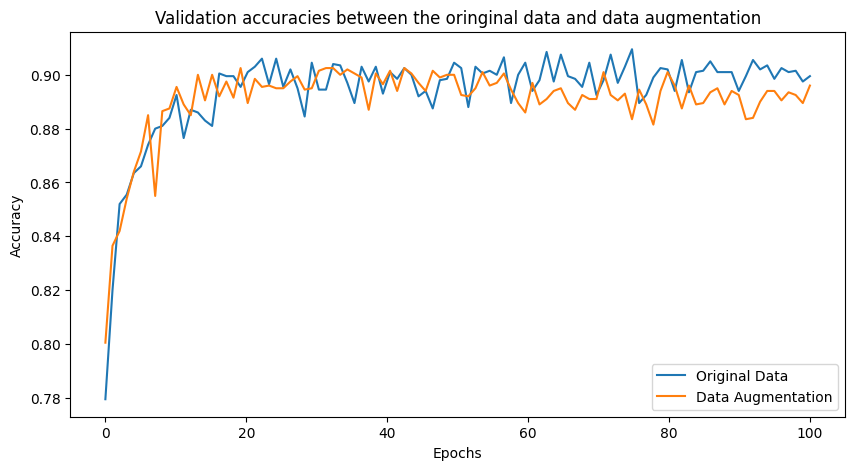

In [ ]:
# Plot using matplotlib
fig = plt.figure(figsize=(10, 5))
plt.plot(np.linspace(0, 100, len(val_acc_1a)), val_acc_1a)
plt.plot(np.linspace(0, 100, len(val_acc_1b)), val_acc_1b)
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Validation accuracies between the oringinal data and data augmentation")
legend = plt.legend(["Original Data", "Data Augmentation"])

### 1.5 Visualize predictions of the test set along with groundtruths and input images

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

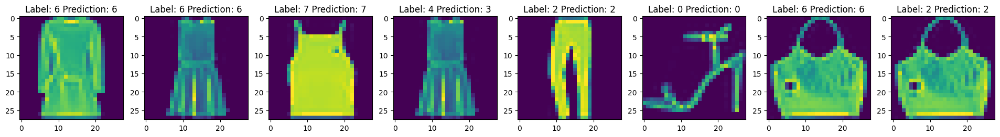

In [ ]:
# Generate predictions using predict function
outputs = trainer_1b.predict(model_2, testloader_data_aug)
test_data_1b, test_label_1b = next(iter(trainloader_data_aug))
fig, ax = plt.subplots(1, 8, figsize = (24, 3))

for img_num, item_num in zip(range(8), test_label_1b[:8]):
    ax[img_num].imshow(test_data_1b[item_num].view(28, 28))
    ax[img_num].set_title(f'Label: {outputs[0][0][img_num]} Prediction: {outputs[0][1][img_num]}')

## Section 2 : Design a shallow CNN and use it to classify STL images

<div class="alert alert-block alert-info">

## What should to do in this task

In this section, a CNN model will be designed for another image classification task. During the implementation how choices in architecture and hyperparameters affect performance can be seen.

### STL Dataset

The dataset is <a href="https://cs.stanford.edu/~acoates/stl10/">STL10</a>. Due to size limit, the data should be obtained from this
<a href="https://drive.google.com/file/d/1khzPamThzWScipEfMmOPevtfWV7Tx6UL/view?usp=sharing">Link</a> (file is 350MB).
<br>
<br>
The dataset represents 10 object classes, namely __'airplane', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'ship', and 'truck'__ in that order. The dataset has 13,000 color images of size $96 \times 96$. This dataset will be divided into 8,000, 2,000, and 3,000 images for training, validation and testing, respectively.

<img src="https://storage.googleapis.com/tfds-data/visualization/fig/stl10-1.0.0.png" alt="alt text" width="600" height="600">

### 2.1 Creating a Pytorch dataset for STL10

As usual, create the PyTorch dataset for this section. The datasets can be seen below:

| Type of data | Access |
| --- | --- |
| Train data (inputs) | data['arr_0']  |
| Train data (labels)| data['arr_1'] |
| Validation data (inputs) | data['arr_2']  |
| Validation data (labels)| data['arr_3'] |
| Test data (inputs) | data['arr_4']  |
| Test data (labels)| data['arr_5'] |

Order of labels:
{'airplane', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'ship', 'truck'}


In [2]:
# Define a dataset structure for the STL-10 Dataset
class STLData(Dataset):
    def __init__(self,trn_val_tst = 0, transform=None):
        data = np.load('STL10.npz')
        if trn_val_tst == 0:
            #trainloader
            self.images = data['arr_0']
            self.labels = data['arr_1']
        elif trn_val_tst == 1:
            #valloader
            self.images = data['arr_2']
            self.labels = data['arr_3']
        else:
            #testloader
            self.images = data['arr_4']
            self.labels = data['arr_5']

        self.images = np.float32(self.images)/1.0
        self.transform = transforms.ToTensor()

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()

        sample = self.images[idx,:]
        labels = self.labels[idx]
        if self.transform:  ## If there is a transform, apply it here to the sample
            sample = self.transform(sample)
        return sample, labels

In [3]:
n_x_train = 8000   # the number of training datapoints
n_x_val = 2000     # the number of validation datapoints
n_x_test = 3000    # the number of testing datapoints
BATCH_SIZE = 128     # the batch size for training task 1
N_WORKERS = 0 # the batch size for testing task 1

# Data augmentations
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Resize(32),
                                transforms.RandomHorizontalFlip(p=0.3),
                                transforms.RandomVerticalFlip(p=0.3),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                                ])

transform_val_test = transforms.Compose([transforms.ToTensor(),
                                transforms.Resize(32),
                                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
                                ])

# Create an instance of the SineDataset for both the training, validation and test set
train_set = STLData(trn_val_tst=0, transform=transform)
val_set = STLData(trn_val_tst=1, transform=transform_val_test)
test_set = STLData(trn_val_tst=2, transform=transform_val_test)

# Pass the dataset to the Pytorch dataloader class along with some other arguments
trainloader = DataLoader(train_set, batch_size=BATCH_SIZE, shuffle=True)
valloader = DataLoader(val_set, batch_size=BATCH_SIZE, shuffle=False)
testloader = DataLoader(test_set, batch_size=BATCH_SIZE, shuffle=False)

## 2.2 Visualize the dataset

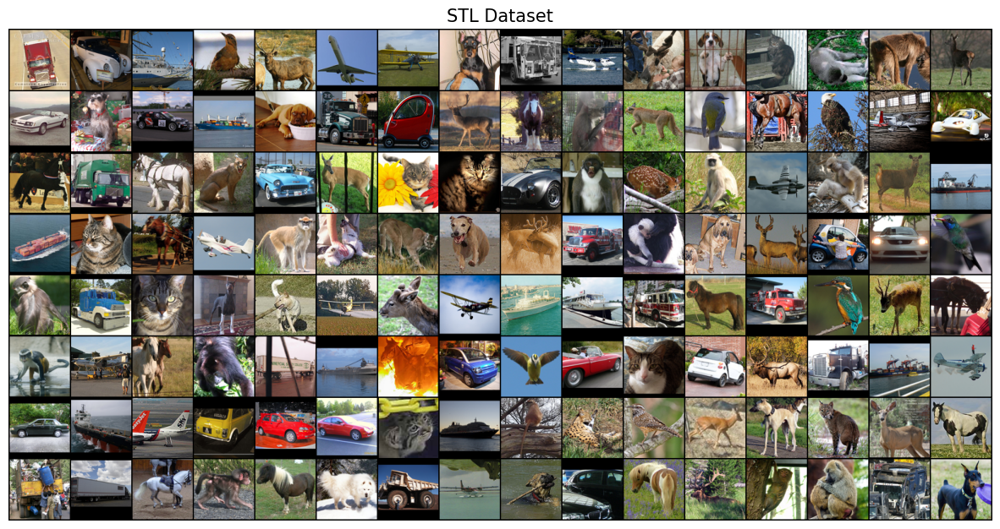

In [4]:
# Create an iterater using the dataloaders and take a random sample
image, labels = next(iter(trainloader))

# Reverse normalization on images
inv_normalize = transforms.Normalize(
                    mean=[-0.5/0.5, -0.5/0.5, -0.5/0.5],
                    std=[1/0.5, 1/0.5, 1/0.5])

images = inv_normalize(image)
image_grid = torchvision.utils.make_grid(image, nrow=16, normalize=True)

# Visualize dataset using torchvision grid
plt.imshow(image_grid.numpy().transpose((1, 2, 0)))
plt.title("STL Dataset", fontsize=15)
plt.gcf().set_size_inches(15, 10)
plt.axis('off')
plt.show()

### 2.3 Design, train, and test a Shallow CNN

In [14]:
class Shallow_CNN(LightningModule):
    def __init__(self, num_classes, learning_rate=1e-4):
        super().__init__()

        self.learning_rate = learning_rate
        self.loss_fun = nn.CrossEntropyLoss()

        self.conv1 = nn.Conv2d(3, 32, 7)
        self.conv2 = nn.Conv2d(32, 64, 5)

        self.GAP = nn.AdaptiveAvgPool2d(2)
        self.fc1 = nn.Linear(256, 128)
        self.fc2 = nn.Linear(128, 10)

        self.train_accuracy = Accuracy(num_classes=num_classes, task='multiclass')
        self.val_accuracy = Accuracy(num_classes=num_classes, task='multiclass')
        self.test_accuracy = Accuracy(num_classes=num_classes, task='multiclass')

    def forward(self, x):
        #Pass input through conv layers
        x = F.relu(self.conv1(x))
        x = F.relu(self.conv2(x))

        #Pass through GAP
        torch.use_deterministic_algorithms(True, warn_only=True)
        x = self.GAP(x)

        #Pass through FC and output it
        x = torch.flatten(x, 1)
        x = F.relu(self.fc1(x))
        x = self.fc2(x)

        return x

    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.loss_fun(logits, y)

        preds = logits.argmax(1)
        self.train_accuracy.update(preds, y)

        self.log("train_loss", loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log("train_acc", self.train_accuracy, prog_bar=True, on_step=False, on_epoch=True)

        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.loss_fun(logits, y)

        preds = logits.argmax(1)
        self.val_accuracy.update(preds, y)

        self.log("val_loss", loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log("val_acc", self.val_accuracy, prog_bar=True, on_step=False, on_epoch=True)

    def test_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.loss_fun(logits, y)

        preds = logits.argmax(1)
        self.test_accuracy.update(preds, y)

        self.log("test_loss", loss, prog_bar=True)
        self.log("test_acc", self.test_accuracy, prog_bar=True)

    def predict_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        preds = logits.argmax(1)
        return [x, logits, preds, y]

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)

        return optimizer

    ####################
    # DATA RELATED HOOKS
    ####################

    def train_dataloader(self):
        return trainloader

    def val_dataloader(self):
        return valloader

    def test_dataloader(self):
        return testloader

Define training and testing methods for the model. Test the model's performance.

In [15]:
# Initialize Model
model_task2 = Shallow_CNN(num_classes=10)

# Train model for 100 epochs
trainer_task2 = Trainer(
    accelerator="auto",
    devices=1 if torch.cuda.is_available() else None,
    max_epochs=100,
    callbacks=[TQDMProgressBar(refresh_rate=20)],
    logger=CSVLogger(save_dir="logs_task2/"),
)
trainer_task2.fit(model_task2)

# Evaluate Model
trainer_task2.test()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name           | Type               | Params
------------------------------------------------------
0 | loss_fun       | CrossEntropyLoss   | 0     
1 | conv1          | Conv2d             | 4.7 K 
2 | conv2          | Conv2d             | 51.3 K
3 | GAP            | AdaptiveAvgPool2d  | 0     
4 | fc1            | Linear             | 32.9 K
5 | fc2            | Linear             | 1.3 K 
6 | train_accuracy | MulticlassAccuracy | 0     
7 | val_accuracy   | MulticlassAccuracy | 0     
8 | test_accuracy  | MulticlassAccuracy | 0     


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/autograd/__init__.py:200: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#cublasApi_reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:156.)
  Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
/usr/local/lib/python3.10/dist-packages/torch/autograd/__init__.py:200: UserWarning: adaptive_avg_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/checkpoint_connector.py:149: UserWarning: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
  rank_zero_warn(
INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at logs_task2/lightning_logs/version_0/checkpoints/epoch=99-step=6300.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at logs_task2/lightning_logs/version_0/checkpoints/epoch=99-step=6300.ckpt


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.6169999837875366     │
│         test_loss         │    1.0816785097122192     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 1.0816785097122192, 'test_acc': 0.6169999837875366}]

### 2.4 Visualize experimental results

In [16]:
# Read logs for model
training_data_2 = pd.read_csv(trainer_task2.logger.log_dir + "/metrics.csv")
training_loss_2 = training_data_2["train_loss"].dropna()
val_loss_2 = training_data_2["val_loss"].dropna()

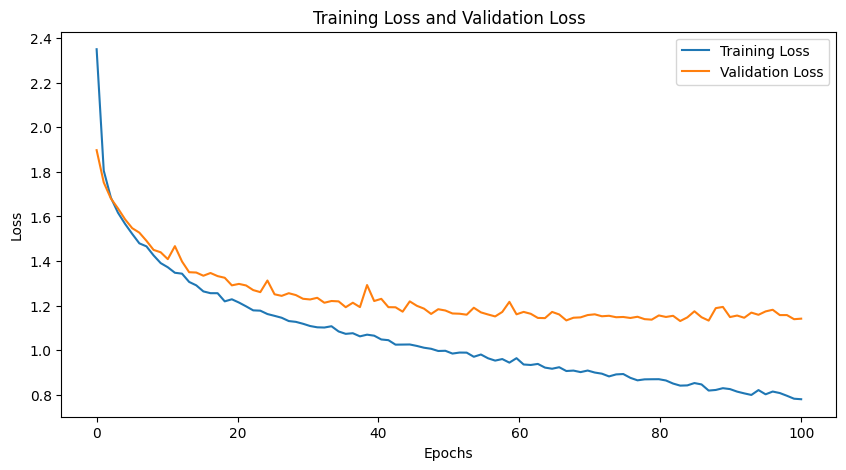

In [17]:
# Plot validation and train loss, both against epoch
fig = plt.figure(figsize=(10, 5))
plt.plot(np.linspace(0, 100, len(training_loss_2)), training_loss_2)
plt.plot(np.linspace(0, 100, len(val_loss_2)), val_loss_2)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training Loss and Validation Loss")
legend = plt.legend(["Training Loss", "Validation Loss"])

### 2.5 Visualize Top Classified and Top Misclassified Images from the test set

For this section, get the top 5 classified and top 5 misclassified images for each of the classes from the test set and discuss.
In total, there are 10 classes, and (5+5) images for each class. The top classified and top misclassified group of images on 2 separate plots / code sections can be displayed.

- Apply a for loop to go through each batch
- Get the predicted probabilities for each image and see if it is correctly classified (or incorrectly classified)
- Rank it based on the predicted probabilities
- Arrange into a neat plot

In [18]:
def getTopClassified(test_loader, trainer, model, num=5):
    ## test_loader is the dataset
    ## trainer is the train object that updated the model
    ## model is the initialised model
    ## num is the number of images plotted per class

    preds = trainer.predict(dataloaders=test_loader) # 24 batches of 128, each entry has form [x, logits, preds, y]
    n_batches = n_x_test/len(preds)

    # save all logit/sm probs
    for i, batch in enumerate(preds):
        incorrect_mask = (batch[2] == batch[3])
        masked_batch = batch[1]*incorrect_mask.unsqueeze(1)
        if i == 0:
            all_sm = F.softmax(masked_batch, dim=-1)
        else:
            all_sm = torch.cat((all_sm, F.softmax(masked_batch, dim=-1)), 0)

    # find top {num} logit prob indices (flattened)
    for i in range(10):
        if i == 0:
            top_prob_idx = torch.topk(all_sm[:, i], num).indices
            top_prob_val = torch.topk(all_sm[:, i], num).values
        else:
            top_prob_idx = torch.cat((top_prob_idx, torch.topk(all_sm[:, i], num).indices), -1)
            top_prob_val = torch.cat((top_prob_val, torch.topk(all_sm[:, i], num).values), -1)

    top_prob_idx = top_prob_idx.reshape((10,-1))
    top_prob_val = top_prob_val.reshape((10,-1))

    # do some math to get correct indexing
    batch_idxs = torch.floor(top_prob_idx/n_batches).type(torch.int)
    img_idxs = torch.remainder(top_prob_idx, n_batches).type(torch.int)

    # get the top {num} un-normalised images into a single tensor
    top_images = []

    for i, cls in enumerate(batch_idxs):
        for j, im in enumerate(cls):
            top_images.append(inv_normalize(preds[im][0][img_idxs[i][j]]).type(torch.int).permute(1,2,0))

    top_images = torch.stack(top_images)
    # print("Shape before reshaping:", top_images.shape)
    top_images = top_images.reshape(10, num, 96, 96, 3)
    # print("Shape after reshaping:", top_images.shape)

    return top_images, top_prob_val


In [19]:
def plotTopClassified(test_loader, trainer, model, num=5, savename=None):
    max_score_images, max_scores = getTopClassified(test_loader, trainer, model, num)
    rowLabels = ['Airplane', 'Bird', 'Car', 'Cat', 'Deer', 'Dog', 'Horse', 'Monkey', 'Ship', 'Truck']

    fig, axs = plt.subplots(10, num, figsize=(10,20))
    # loop and plot
    for class_num in range(10):
        for i in range(num):
            ## Use np.moveaxis
            ## Use subplot
            ## Turn off xticks and yticks
            ## Plot the images
            axs[class_num, i].imshow(max_score_images[class_num][i])
            axs[class_num, i].set_yticks([])
            axs[class_num, i].set_xticks([], minor=True)

            if i==0:
                axs[class_num, i].set_ylabel(rowLabels[class_num])

            axs[class_num, i].set_title(f"Prob: {max_scores[class_num][i].item()*100:.2f}%")

    plt.tight_layout()
    if savename is not None:
        plt.savefig(savename,dpi=200)


/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/checkpoint_connector.py:149: UserWarning: `.predict(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.predict(ckpt_path='best')` to use the best model or `.predict(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
  rank_zero_warn(
INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at logs_task2/lightning_logs/version_0/checkpoints/epoch=99-step=6300.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at logs_task2/lightning_logs/version_0/checkpoints/epoch=99-step=6300.ckpt


Predicting: 0it [00:00, ?it/s]

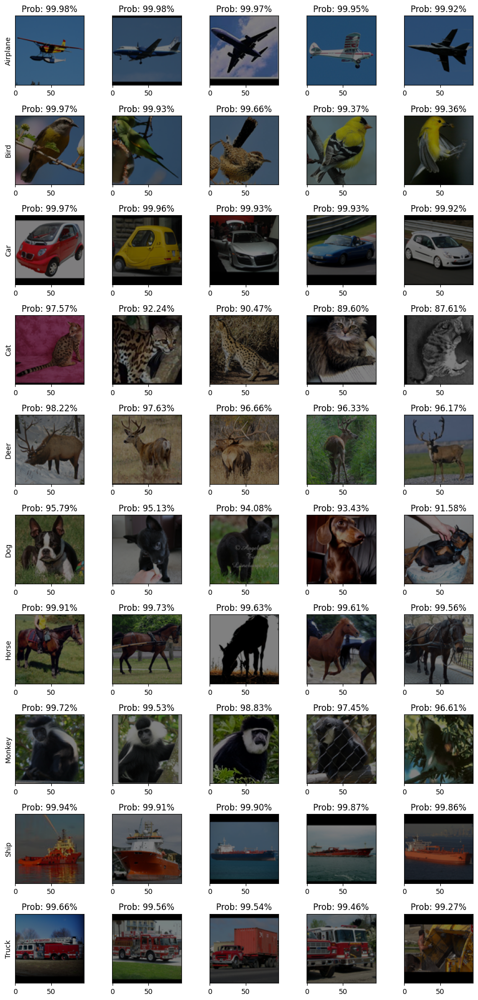

In [20]:
# For simplicity of coding, recreate test loader with batch size of 1
testloader_bs1 = DataLoader(test_set, batch_size=1, shuffle=False, num_workers=N_WORKERS, drop_last=False)

# Visualize Top Classified
plotTopClassified(testloader_bs1, trainer_task2, model_task2, num=5, savename='section2_top_classified')

In [21]:
def getTopMisclassified(test_loader, trainer, model, num=5):

    ## test_loader is the dataset
    ## trainer is the train object that updated the model
    ## model is the initialised model
    ## num is the number of images plotted per class

    preds = trainer.predict(dataloaders=test_loader) # 24 batches of 128, each entry has form [x, logits, preds, y]
    n_batches = n_x_test/len(preds)

    # save all logit/sm probs
    for i, batch in enumerate(preds):
        incorrect_mask = (batch[2] != batch[3])
        masked_batch = batch[1]*incorrect_mask.unsqueeze(1)
        if i == 0:
            all_sm = F.softmax(masked_batch, dim=-1)
        else:
            all_sm = torch.cat((all_sm, F.softmax(masked_batch, dim=-1)), 0)

    # find top {num} logit prob indices (flattened)
    for i in range(10):
        if i == 0:
            top_prob_idx = torch.topk(all_sm[:, i], num).indices
            top_prob_val = torch.topk(all_sm[:, i], num).values
        else:
            top_prob_idx = torch.cat((top_prob_idx, torch.topk(all_sm[:, i], num).indices), -1)
            top_prob_val = torch.cat((top_prob_val, torch.topk(all_sm[:, i], num).values), -1)

    top_prob_idx = top_prob_idx.reshape((10,-1))
    top_prob_val = top_prob_val.reshape((10,-1))

    # do some math to get correct indexing
    batch_idxs = torch.floor(top_prob_idx/n_batches).type(torch.int)
    img_idxs = torch.remainder(top_prob_idx, n_batches).type(torch.int)

    # get the top {num} un-normalised images into a single tensor
    top_images = []

    for i, cls in enumerate(batch_idxs):
        for j, im in enumerate(cls):
            top_images.append(inv_normalize(preds[im][0][img_idxs[i][j]]).type(torch.int).permute(1,2,0))

    top_images = torch.stack(top_images).reshape(10, num, 96, 96, 3)

    return top_images, top_prob_val

In [22]:
def plotTopMisclassified(test_loader, trainer, model, num=5, savename=None):
    max_score_images, max_scores = getTopMisclassified(test_loader, trainer, model, num)
    rowLabels = ['Airplane', 'Bird', 'Car', 'Cat', 'Deer', 'Dog', 'Horse', 'Monkey', 'Ship', 'Truck']

    fig, axs = plt.subplots(10, num, figsize=(10,20))
    for class_num in range(10):
        for i in range(num):
            ## Use np.moveaxis
            ## Use subplot
            ## Turn off xticks and yticks
            ## Plot the images
            axs[class_num, i].imshow(max_score_images[class_num][i])
            axs[class_num, i].set_yticks([])
            axs[class_num, i].set_xticks([], minor=True)

            if i==0:
                axs[class_num, i].set_ylabel(rowLabels[class_num])

            axs[class_num, i].set_title(f"Prob: {max_scores[class_num][i].item()*100:.2f}%")

    plt.tight_layout()
    if savename is not None:
        plt.savefig(savename,dpi=200)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at logs_task2/lightning_logs/version_0/checkpoints/epoch=99-step=6300.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at logs_task2/lightning_logs/version_0/checkpoints/epoch=99-step=6300.ckpt


Predicting: 0it [00:00, ?it/s]

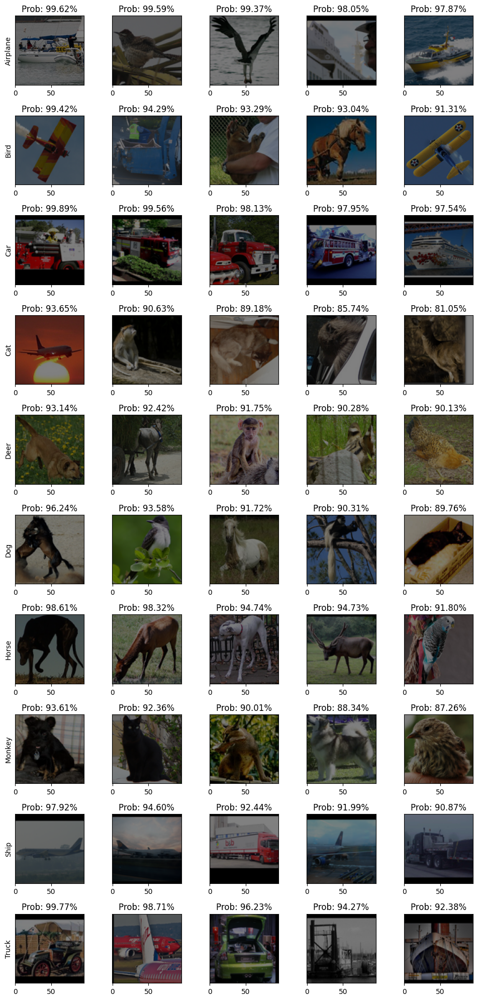

In [23]:
# Visualize Top Misclassified
plotTopMisclassified(testloader_bs1, trainer_task2, model_task2, num=5, savename='section2_top_misclassified')

## Section 3 : Design and analysis of a deep CNN

<div class="alert alert-block alert-info">

In this section, a deep CNN model will be designed for the above classification task. The purpose of this task is to further improve on the previous model through various techniques, such as hyperparameter tuning and also modifying the model architecture.
   
 1. Design the Deep CNN model using the PyTorch Lightning Module.
    
 2. Train and evaluate the Deep CNN model on the defined train, validation and test datasets.
    
 3. Visualize experimental results using Matplotlib.

 4. Visualize the Confusion Matrix for the test set.

 5. Discussion.

### 3.1 Design a Deep CNN model

In [5]:
class ConvBlock(nn.Module):

    def __init__(self, channels_in, channels_out):
        super(ConvBlock, self).__init__()     # Call constructor
        self.act = nn.ReLU() ## Activation function
        self.conv1 = nn.Conv2d(channels_in, channels_out, 3, padding = 1)
        self.conv2 = nn.Conv2d(channels_out, channels_out, 1, padding = 0)
        self.conv3 = nn.Conv2d(channels_out, channels_out, 3, padding = 0)

    def forward(self, x):
        x = self.act(self.conv1(x))
        x = self.act(self.conv2(x))
        x = self.act(self.conv3(x))

        return x


class Deep_CNN(LightningModule):
    def __init__(self, num_classes=10, learning_rate=1e-4):
        super().__init__()

        self.learning_rate = learning_rate
        self.loss_fun = nn.CrossEntropyLoss()

        self.conv_blk1 = ConvBlock(3, 32)
        self.conv_blk2 = ConvBlock(32, 64)
        self.conv_blk3 = ConvBlock(64, 128)
        self.conv_blk4 = ConvBlock(128, 192)
        self.GAP = nn.AdaptiveAvgPool2d(3)

        self.fc1 = nn.Linear(1728, 10)

        self.train_accuracy = Accuracy(num_classes=num_classes, task='multiclass')
        self.val_accuracy = Accuracy(num_classes=num_classes, task='multiclass')
        self.test_accuracy = Accuracy(num_classes=num_classes, task='multiclass')

    def forward(self, x):
        #Pass input through conv layers
        x = self.conv_blk1(x)
        x = self.conv_blk2(x)
        x = self.conv_blk3(x)
        x = self.conv_blk4(x)
        # Pass through GAP
        x = self.GAP(x)
        x = x.view(x.shape[0], -1)
        # Pass through FC, and output it
        x = self.fc1(x)

        return x

    def training_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.loss_fun(logits, y)

        preds = logits.argmax(1)
        self.train_accuracy.update(preds, y)
        self.log("train_loss", loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log("train_acc", self.train_accuracy, prog_bar=True, on_step=False, on_epoch=True)

        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.loss_fun(logits, y)

        preds = logits.argmax(1)
        self.val_accuracy.update(preds, y)

        self.log("val_loss", loss, prog_bar=True, on_step=False, on_epoch=True)
        self.log("val_acc", self.val_accuracy, prog_bar=True, on_step=False, on_epoch=True)

    def test_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        loss = self.loss_fun(logits, y)

        preds = logits.argmax(1)
        self.test_accuracy.update(preds, y)

        self.log("test_loss", loss, prog_bar=True)
        self.log("test_acc", self.test_accuracy, prog_bar=True)

    def predict_step(self, batch, batch_idx):
        x, y = batch
        logits = self(x)
        preds = logits.argmax(1)
        return preds, y

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)

        return optimizer

    ####################
    # DATA RELATED HOOKS
    ####################

    def train_dataloader(self):
        return trainloader

    def val_dataloader(self):
        return valloader

    def test_dataloader(self):
        return testloader

### 3.2 Train and visualize results for the deep CNN

In [6]:
# Initialize Model with Adam optimizer
deep_model = Deep_CNN()

# Train model for 150 epochs
trainer_task3 = Trainer(
    accelerator="auto",
    devices=1 if torch.cuda.is_available() else None,
    max_epochs=100,
    callbacks=[TQDMProgressBar(refresh_rate=20)],
    logger=CSVLogger(save_dir="logs_task3/")
)
trainer_task3.fit(deep_model)

# Evaluate Model
trainer_task3.test()

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name           | Type               | Params
------------------------------------------------------
0 | loss_fun       | CrossEntropyLoss   | 0     
1 | conv_blk1      | ConvBlock          | 11.2 K
2 | conv_blk2      | ConvBlock          | 59.6 K
3 | conv_blk3      | ConvBlock          | 237 K 
4 | conv_blk4      | ConvBlock          | 590 K 
5 | GAP            | AdaptiveAvgPool2d  | 0     
6 | fc1            | Linear             | 17.3 K
7 | train_accuracy | MulticlassAccuracy | 0     
8 | val_accuracy   | MulticlassAccuracy | 0     


Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=100` reached.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/checkpoint_connector.py:149: UserWarning: `.test(ckpt_path=None)` was called without a model. The best model of the previous `fit` call will be used. You can pass `.test(ckpt_path='best')` to use the best model or `.test(ckpt_path='last')` to use the last model. If you pass a value, this warning will be silenced.
  rank_zero_warn(
INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at logs_task3/lightning_logs/version_0/checkpoints/epoch=99-step=6300.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at logs_task3/lightning_logs/version_0/checkpoints/epoch=99-step=6300.ckpt


Testing: 0it [00:00, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.6713333129882812     │
│         test_loss         │    0.9865465760231018     │
└───────────────────────────┴───────────────────────────┘

[{'test_loss': 0.9865465760231018, 'test_acc': 0.6713333129882812}]

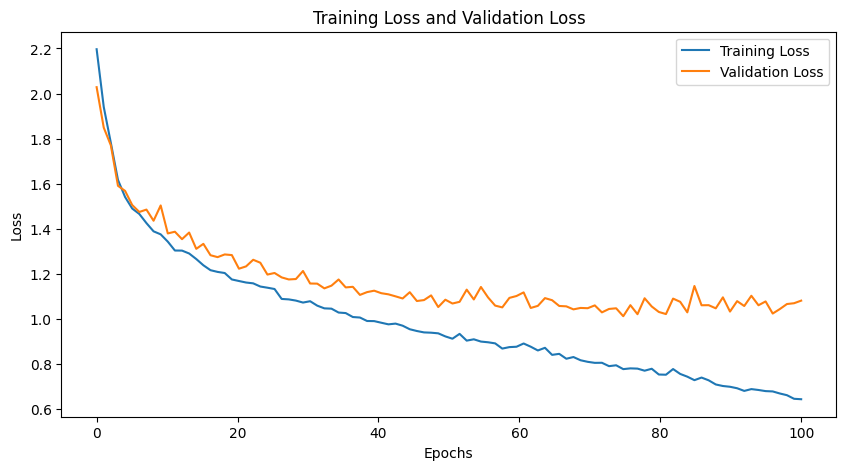

In [7]:
# Read logs for model trained with Adam
training_data_3 = pd.read_csv(trainer_task3.logger.log_dir + "/metrics.csv")
training_loss_3 = training_data_3["train_loss"].dropna()
val_loss_3 = training_data_3["val_loss"].dropna()

# Visualize results (train and validation loss against epoch)
fig = plt.figure(figsize=(10, 5))
plt.plot(np.linspace(0, 100, len(training_loss_3)), training_loss_3)
plt.plot(np.linspace(0, 100, len(val_loss_3)), val_loss_3)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training Loss and Validation Loss")
legend = plt.legend(["Training Loss", "Validation Loss"])

### 3.3 Define a Confusion Matrix function and visualize the Confusion Matrix for the test set.

The confusion matrix is a good way to understand which classes a network is good at classifying, while also seeing the pitfalls of the model (perhaps it confuses a plane with a truck?).

What is a confusion matrix? It tabulates how many instances of each class are: 1) Classified correctly 2) Classified incorrectly and as which class it is classified incorrectly

This can focus on the potential pitfalls/weaknesses of the model, and potentially use this information to improve the model in several ways. Example image of a confusion matrix:

<!-- ![image info]() -->

<img src="https://miro.medium.com/max/1400/1*TOVAm14q2GsAnx8q79nQlQ.png" alt="alt text" width="500" height="400">

Additional information on confusion matrices: https://www.analyticsvidhya.com/blog/2020/04/confusion-matrix-machine-learning/

In [47]:
def getConfusionMatrix(test_loader, trainer, model):
    # Number of classes is 10
    # Calculates the 10 x 10 grid for the predictions for each class
    # Rows are actual classes, columns are predicted classes
    confMat = torch.zeros((10,10)).type(torch.int32)
    preds = trainer.predict(dataloaders=test_loader)

    for idx in range(len(test_loader)):
        for j in range(10):
            confMat[j] += preds[idx][1][preds[idx][0]==j].bincount(minlength=10)

    return confMat


def plotAllConfMats(model, test_loader, trainer, savename):

    confMat = getConfusionMatrix(test_loader, trainer, model)

    cellColours = plt.cm.get_cmap('Greens')((mpcol.Normalize()(np.power(confMat, 1/3))) * 0.8)
    rowLabels = ['Airplane', 'Bird', 'Car', 'Cat', 'Deer', 'Dog', 'Horse', 'Monkey', 'Ship', 'Truck']

    plt.figure(figsize=(10, 5))
    plt.imshow(cellColours, interpolation='nearest', cmap='Greens')
    plt.xticks(np.arange(10), rowLabels, rotation=45)
    plt.yticks(np.arange(10), rowLabels)
    plt.ylabel('True labels')
    plt.title('Confusion Matrix')

    if savename is not None:
        plt.savefig(savename, dpi=200)
    else:
        plt.show()

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at logs_task3/lightning_logs/version_0/checkpoints/epoch=99-step=6300.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at logs_task3/lightning_logs/version_0/checkpoints/epoch=99-step=6300.ckpt


Predicting: 0it [00:00, ?it/s]

<ipython-input-47-c6fac04a02f7>:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cellColours = plt.cm.get_cmap('Greens')((mpcol.Normalize()(np.power(confMat, 1/3))) * 0.8)


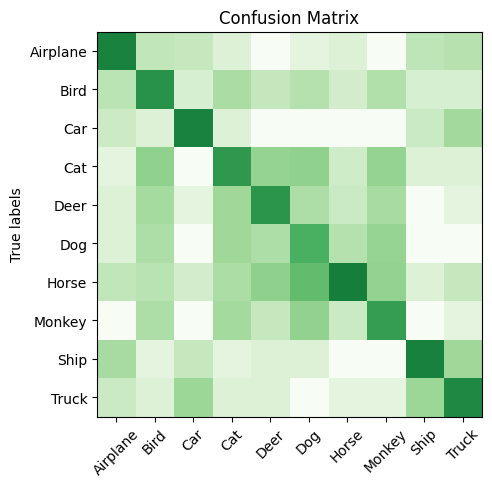

In [48]:
plotAllConfMats(deep_model, testloader_bs1, trainer_task3, 'section_3_confMat')